In [1]:
# importlib: 사용자가 파이썬의 import 시스템과 상호작용하기 위한 API를 제공하는 내장 라이브러리
# 사용자는 import 함수의 구현 내용과, 실행에 필요한 하위 함수들을 이용해 필요에 맞는 임포터를 직접 구현하거나 임포트 관련 기능들을 자유롭게 사용할 수 있음
# importlib.metadata: 설치된 패키지 메타 데이터에 대한 접근을 제공하는 라이브러리.
# 해당 코드 블럭에서는 importlib.metadata 안에 있는 version() 함수를 이용하여 pixellib 라이브러리의 버전을 확인

from importlib.metadata import version
import os
import urllib                                         # urllib: URL 작업을 위한 여러 모듈을 모은 패키지. (Ex. urllib.request, urllib.parse, ...)
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation   # The class for performing semantic segmentation is imported from pixellib
                                                      # pixellib.semantic: segmentation 기법 중, semantic segmentation을 쉽게 사용할 수 있도록 만든 라이브러리
from matplotlib import pyplot as plt

# STEP 1. 이미지 불러오기

- 여러분의 셀카를 이용해서 오늘 배운 내용을 수행해 봅시다. 아래와 같은 이미지를 얻어야 합니다. 최소 3장 이상의 인물모드 사진을 만들어 봅시다.
- 인물이 주인공이 아닌, 귀여운 고양이에 대한 아웃포커싱 사진도 만들어 볼 수 있을 것입니다. 시맨틱 세그멘테이션 스텝에서 힌트를 찾아봅시다.
- 배경을 blur하는 인물모드 사진이 아니라 배경사진을 다른 이미지로 교체하는 크로마키 배경 합성을 시도해 볼 수도 있을 것입니다. 여러분만의 환상적인 사진을 만들어 보면 어떨까요?

### 이미지 사진 경로

In [2]:
img_dir = os.getenv("HOME") + "/aiffel/LMS/Exploration/[Exp_09] 인물사진을 만들어 보자/data/"
img_name = os.listdir(img_dir)
img_name.remove('.ipynb_checkpoints')
img_name

['mountain.JPG', 'dog.jpg', 'somewhere.jpeg']

### 이미지 불러오기 함수 정의

In [3]:
def load_img(name):
    img_dir = os.getenv("HOME") + "/aiffel/LMS/Exploration/[Exp_09] 인물사진을 만들어 보자/data/"
    img_path = img_dir + name
    
    img_orig = cv2.imread(img_path)                                             # 이미지 불러오기

    img_orig = cv2.resize(img_orig, (600, 400), interpolation = cv2.INTER_AREA) # 이미지 사이즈 변경
    print(img_orig.shape)
    plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
    plt.show()
    
    return img_orig, img_path

### 이미지 불러오기

(400, 600, 3)


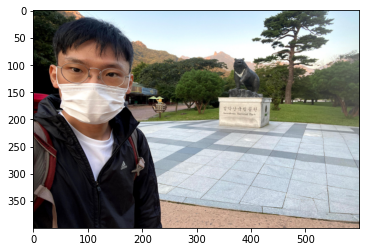

(400, 600, 3)


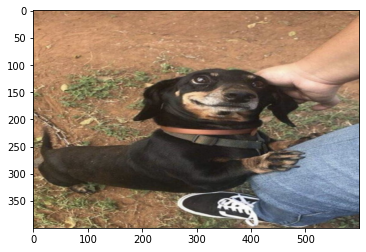

(400, 600, 3)


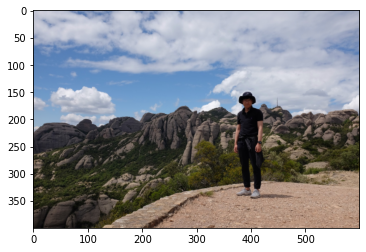

In [4]:
img_selfi, img_selfi_path = load_img(img_name[0])
img_dog, img_dog_path = load_img(img_name[1])
img_somewhere, img_somewhere_path = load_img(img_name[2])

# STEP 2. Sementic Segmentation - DeepLab 모델 불러오기

### 모델 가중치 다운로드 경로 설정

In [5]:
# 저장할 파일 이름을 결정합니다
model_dir = os.getenv('HOME') + '/aiffel/human_segmentation/models' 
model_file_path = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')        # 학습된 가중치 파일

### 모델 가중치 다운로드

In [6]:
# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'  # 가중치 다운로드

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file_path)   # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7fd001f5a310>)

### 모델 객체 생성 및 가중치 로드하기

In [7]:
model = semantic_segmentation()              # PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file_path)  # called the method to load the xception model trained on pascal voc
                                             # pascal voc으로 훈련된 모델(model_file)을 로드하는 함수를 호출
                                             # 참고 - https://pixellib.readthedocs.io/en/stable/semantic.html 

### 모델에 이미지 넣기

In [8]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

# STEP 3. 세그먼트 모델에 이미지 적용

### segmentAsPascalvoc() 호출 함수 정의

In [9]:
def seg_model(img_path):
    output, segmap = model.segmentAsPascalvoc(img_path)      # segmentAsPascalvoc()함수를 호출 하여 입력된 이미지를 segmentation함
                                                             # 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용
                                                             # 설명 참고함 - https://pixellib.readthedocs.io/en/stable/semantic.html  
    segmap = cv2.resize(segmap, (600, 400), interpolation = cv2.INTER_AREA)     # 이미지 사이즈 변경
    print(segmap.shape)
    return output, segmap

# STEP 4. 사진 적용해보기

## 4.1 Selfi 사진

(400, 600, 3)


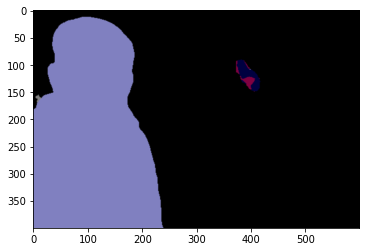

In [10]:
# model.segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
output, segmap = seg_model(img_selfi_path)         # segmap의 배열은 BGR 순서
                                                   # 설명 참고함 - https://pixellib.readthedocs.io/en/stable/semantic.html 

plt.imshow(segmap)
plt.show()

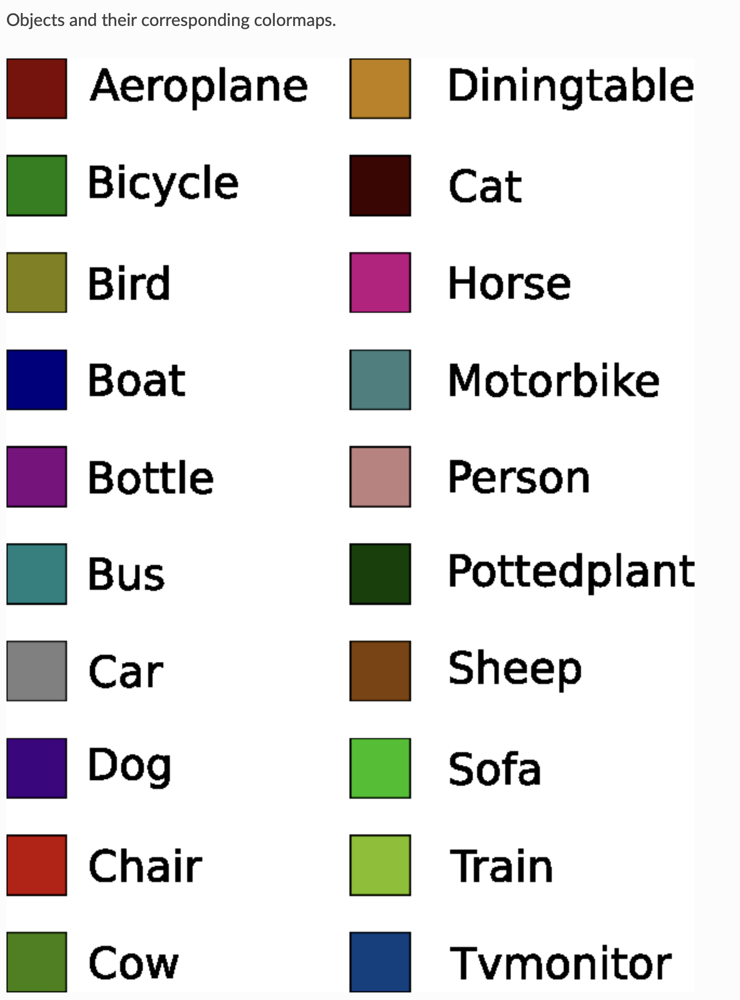

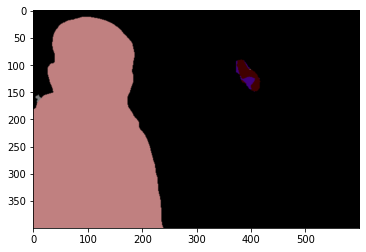

In [11]:
# BGR인 segmap을 RGB로 변환하여 확인
plt.imshow(cv2.cvtColor(segmap, cv2.COLOR_BGR2RGB))

In [12]:
output               # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지에서 객체를 구분한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([ 0,  7,  8, 12, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False],
        [ True,  True,  True, ..., False, False, False]])}

In [13]:
#seg_values에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in output['class_ids']:
    print(LABEL_NAMES[class_id])

background
car
cat
dog
person


In [14]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생성 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]                        # 생성한 20개의 컬러맵 출력
                                     # 각 컬러맵은 RGB순

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [15]:
colormap[15]            # 컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)
                        # RGB 순서

array([192, 128, 128])

In [16]:
colormap[7]             # 컬러맵 7에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 7번째인 자동차)
                        # RGB 순서

array([128, 128, 128])

In [17]:
colormap[8]             # 컬러맵 8에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 8번째인 개)
                        # RGB 순서

array([64,  0,  0])

In [18]:
colormap[12]            # 컬러맵 12에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 12번째인 고양이)
                        # RGB 순서

array([ 64,   0, 128])

문제점 : 
1. 자동차는 사진에 없다
2. 곰 동상을 고양이로 추출함
3. 곰 동상을 개로 추출함

In [19]:
# RGB를 BGR로 순서 변경
seg_color_BGR_dict = {}
for class_id in output['class_ids']:
    if class_id == 0: continue                             # Background는 패스!
    colormap_class = tuple(colormap[class_id][::-1])       # RGB인 colormap을 BGR로 변경 
                                                           # 예를 들어, 사람 색상 RGB인 (192,128,128)을 BGR인 (128,128,192)로 새 변수 설정
                                                           # 이유: colormap의 배열은 RGB 순이며 메서드 결과인 segmap의 배열은 BGR 순서로 채널 배치가 되어 있기 때문
    seg_color_BGR_dict[LABEL_NAMES[class_id]] = colormap_class

seg_color_BGR_dict

{'car': (128, 128, 128),
 'cat': (0, 0, 64),
 'dog': (128, 0, 64),
 'person': (128, 128, 192)}

In [20]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
def remove_background(key, seg_color_BGR):
    seg_map = np.all(segmap==seg_color_BGR, axis=-1)                          # 배열의 조건이 전부 맞으면 True, 아니면 False
    
    print(key, "(removed background)")
    print(seg_map.shape)
    
    plt.figure(figsize=(8, 8))
    plt.imshow(seg_map, cmap='gray')
    plt.show()
    
    return seg_map

car (removed background)
(400, 600)


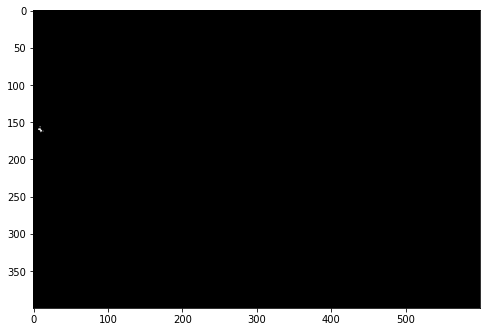

cat (removed background)
(400, 600)


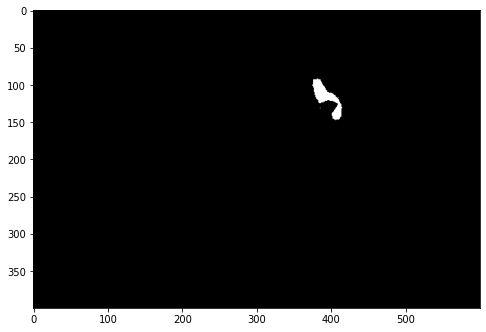

dog (removed background)
(400, 600)


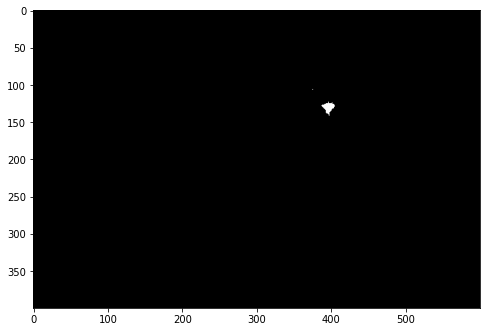

person (removed background)
(400, 600)


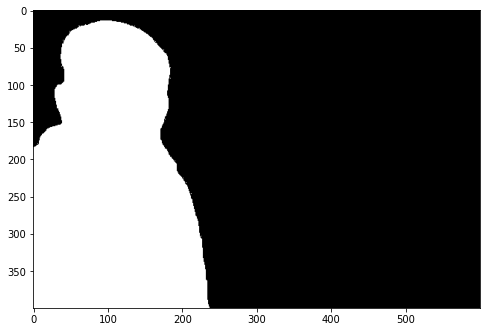

In [21]:
for key, seg_color_BGR in seg_color_BGR_dict.items():

    seg_map = remove_background(key, seg_color_BGR)                       # 누끼따는 remove_background 함수 호출
    if key == 'person':
        seg_map_person = seg_map

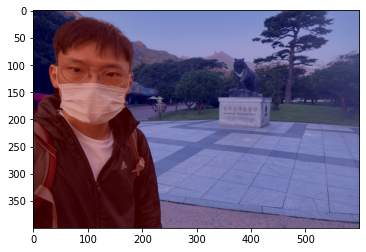

In [31]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든 뒤 두 이미지를 합쳐서 출력
img_show = img_selfi.copy()

# True과 False인 값을 각각 1과 0으로 변경
# 1과 0에 255을 곱해 각각 255과 0으로 바꿔줍니다
img_mask_person = seg_map_person.astype(np.uint8) * 255             # 아직 여기까지는 흑백인 1채널

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask_person, cv2.COLORMAP_JET)   # 1채널 img_mask를 3채널로 변경함. 이유는 cv2.addWeighted()에서 동일한 채널이어야 하므로

# 원본 이미지와 마스크를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)  # https://docs.opencv.org/3.4/d2/de8/group__core__array.html#gafafb2513349db3bcff51f54ee5592a19
                                                                        

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

### 배경흐리게 하기

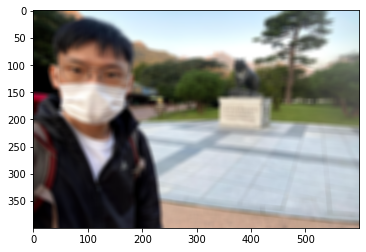

In [30]:
# (10,10)은 blurring kernel size를 뜻합니다
img_orig_blur = cv2.blur(img_selfi.copy(), (10,10))   # BGR

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)   
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

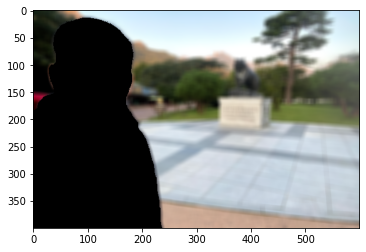

In [57]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 "채널"을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 이미지 색상 채널을 변경해야함 (RGB 형식을 BGR 형식으로 변경) 
# ?????????????????????????????????????????????????????????????????????
img_mask_person_color_BGR = cv2.cvtColor(img_mask_person, cv2.COLOR_GRAY2BGR)    # 1채널을 3채널로 변경

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_person_color_BGR)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)


plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

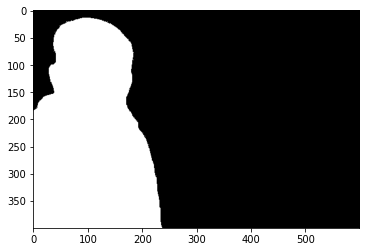

In [58]:
# 확인용
plt.imshow(cv2.cvtColor(img_mask_person, cv2.COLOR_GRAY2BGR))

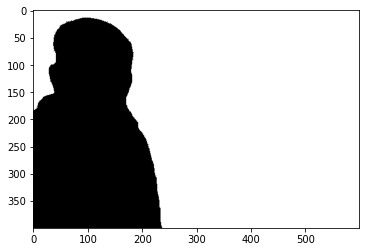

In [59]:
# 확인용
plt.imshow(cv2.bitwise_not(img_mask_person_color_BGR))

### 흐린 배경과 원본 합성

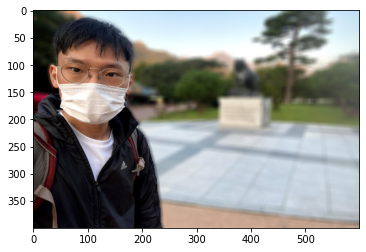

In [61]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고, 그렇지 않으면 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_person_color_BGR==255, img_selfi, img_bg_blur)


# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

## 4.2  강아지 사진

(400, 600, 3)


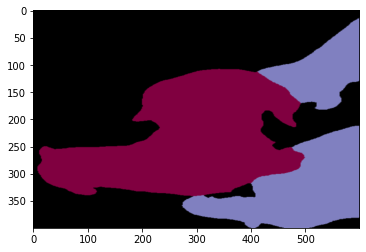

In [62]:
# model.segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
output, segmap = seg_model(img_dog_path)         # segmap의 배열은 BGR 순서
                                                 # 설명 참고함 - https://pixellib.readthedocs.io/en/stable/semantic.html 

plt.imshow(segmap)
plt.show()

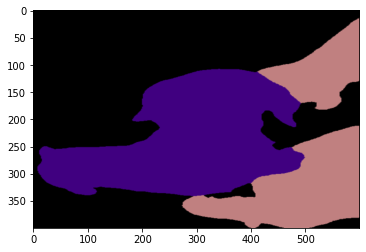

In [63]:
# BGR인 segmap을 RGB로 변환하여 확인
plt.imshow(cv2.cvtColor(segmap, cv2.COLOR_BGR2RGB))

In [64]:
output               # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지에서 객체를 구분한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([ 0, 12, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [65]:
#seg_values에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in output['class_ids']:
    print(LABEL_NAMES[class_id])

background
dog
person


In [74]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생성 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]                        # 생성한 20개의 컬러맵 출력
                                     # 각 컬러맵은 RGB순

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [67]:
colormap[12]            # 컬러맵 12에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 12번째인 강아지)
                        # RGB 순서

array([ 64,   0, 128])

In [69]:
colormap[15]            # 컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)
                        # RGB 순서

array([192, 128, 128])

In [75]:
# RGB를 BGR로 순서 변경
seg_color_BGR_dict = {}
for class_id in output['class_ids']:
    if class_id == 0: continue                             # Background는 패스!
    colormap_class = tuple(colormap[class_id][::-1])       # RGB인 colormap을 BGR로 변경 
                                                           # 예를 들어, 사람 색상 RGB인 (192,128,128)을 BGR인 (128,128,192)로 새 변수 설정
                                                           # 이유: colormap의 배열은 RGB 순이며 메서드 결과인 segmap의 배열은 BGR 순서로 채널 배치가 되어 있기 때문
    seg_color_BGR_dict[LABEL_NAMES[class_id]] = colormap_class

seg_color_BGR_dict

{'dog': (128, 0, 64), 'person': (128, 128, 192)}

In [76]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
def remove_background(key, seg_color_BGR):
    seg_map = np.all(segmap==seg_color_BGR, axis=-1)                          # 배열의 조건이 전부 맞으면 True, 아니면 False
    
    print(key, "(removed background)")
    print(seg_map.shape)
    
    plt.figure(figsize=(8, 8))
    plt.imshow(seg_map, cmap='gray')
    plt.show()
    
    return seg_map

dog (removed background)
(400, 600)


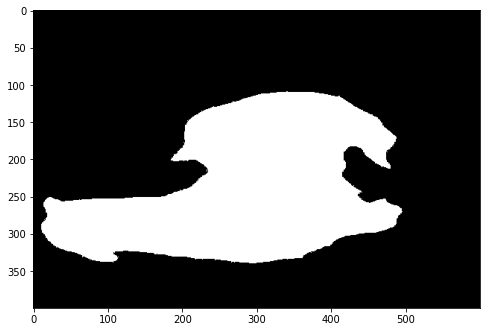

person (removed background)
(400, 600)


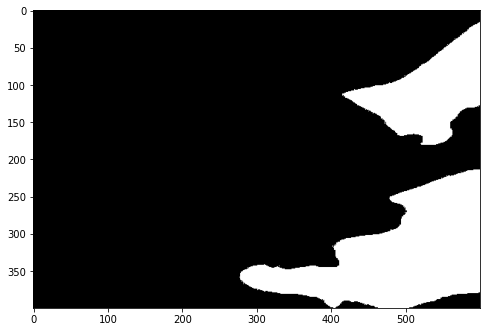

In [79]:
for key, seg_color_BGR in seg_color_BGR_dict.items():

    seg_map = remove_background(key, seg_color_BGR)                       # 누끼따는 remove_background 함수 호출
    if key == 'dog':
        seg_map_dog = seg_map

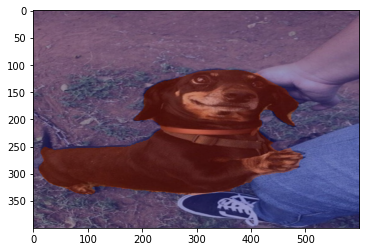

In [81]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든 뒤 두 이미지를 합쳐서 출력
img_show = img_dog.copy()

# True과 False인 값을 각각 1과 0으로 변경
# 1과 0에 255을 곱해 각각 255과 0으로 바꿔줍니다
img_mask_dog = seg_map_dog.astype(np.uint8) * 255             # 아직 여기까지는 흑백인 1채널

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask_dog, cv2.COLORMAP_JET)   # 1채널 img_mask를 3채널로 변경함. 이유는 cv2.addWeighted()에서 동일한 채널이어야 하므로

# 원본 이미지와 마스크를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)  # https://docs.opencv.org/3.4/d2/de8/group__core__array.html#gafafb2513349db3bcff51f54ee5592a19
                                                                        

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

###  배경흐리게 하기

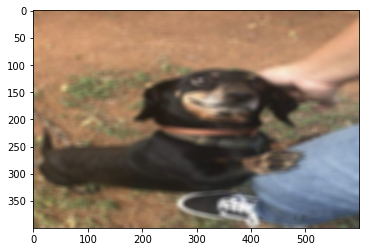

In [82]:
# (10,10)은 blurring kernel size를 뜻합니다
img_orig_blur = cv2.blur(img_dog.copy(), (10,10))   # BGR

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)   
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

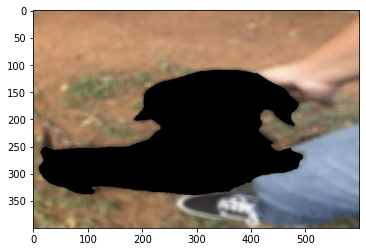

In [84]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 "채널"을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 이미지 색상 채널을 변경해야함 (RGB 형식을 BGR 형식으로 변경) 
img_mask_dog_color_BGR = cv2.cvtColor(img_mask_dog, cv2.COLOR_GRAY2BGR)    # 1채널을 3채널로 변경

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_dog_color_BGR)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)


plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

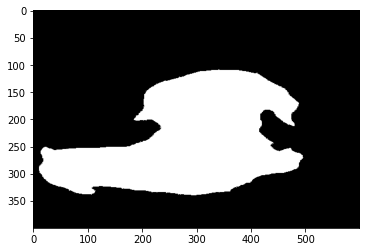

In [86]:
# 확인용
plt.imshow(cv2.cvtColor(img_mask_dog, cv2.COLOR_GRAY2BGR))

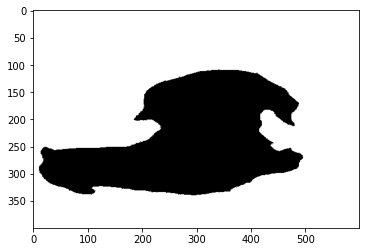

In [87]:
# 확인용
plt.imshow(cv2.bitwise_not(img_mask_dog_color_BGR))

### 흐린 배경과 원본 합성

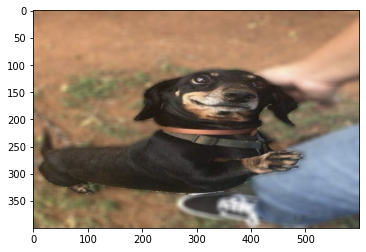

In [90]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고, 그렇지 않으면 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_dog_color_BGR==255, img_dog, img_bg_blur)


# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

## 4.3 여행 사진

(400, 600, 3)


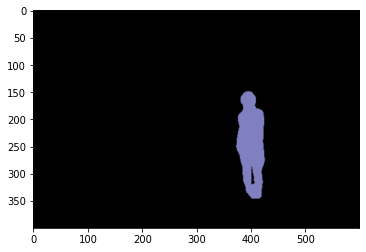

In [91]:
# model.segmentAsPascalvoc() 함수를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
output, segmap = seg_model(img_somewhere_path)         # segmap의 배열은 BGR 순서
                                                 # 설명 참고함 - https://pixellib.readthedocs.io/en/stable/semantic.html 

plt.imshow(segmap)
plt.show()

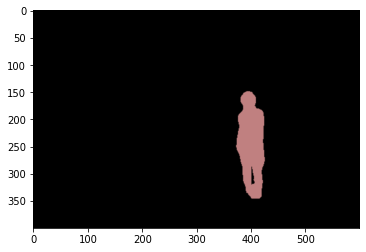

In [92]:
# BGR인 segmap을 RGB로 변환하여 확인
plt.imshow(cv2.cvtColor(segmap, cv2.COLOR_BGR2RGB))

In [93]:
output               # segmentAsPascalvoc() 함수를 호출하여 입력된 이미지에서 객체를 구분한 뒤 나온 결과값 중 배열값을 출력

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [94]:
#seg_values에 있는 class_ids를 담겨있는 값을 통해 pacalvoc에 담겨있는 라벨을 출력
for class_id in output['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [95]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생성 코드 결과물이예요!

#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]                        # 생성한 20개의 컬러맵 출력
                                     # 각 컬러맵은 RGB순

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [ ]:
colormap[15]            # 컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)
                        # RGB 순서

In [97]:
# RGB를 BGR로 순서 변경
seg_color_BGR_dict = {}
for class_id in output['class_ids']:
    if class_id == 0: continue                             # Background는 패스!
    colormap_class = tuple(colormap[class_id][::-1])       # RGB인 colormap을 BGR로 변경 
                                                           # 예를 들어, 사람 색상 RGB인 (192,128,128)을 BGR인 (128,128,192)로 새 변수 설정
                                                           # 이유: colormap의 배열은 RGB 순이며 메서드 결과인 segmap의 배열은 BGR 순서로 채널 배치가 되어 있기 때문
    seg_color_BGR_dict[LABEL_NAMES[class_id]] = colormap_class

seg_color_BGR_dict

{'person': (128, 128, 192)}

In [98]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
def remove_background(key, seg_color_BGR):
    seg_map = np.all(segmap==seg_color_BGR, axis=-1)                          # 배열의 조건이 전부 맞으면 True, 아니면 False
    
    print(key, "(removed background)")
    print(seg_map.shape)
    
    plt.figure(figsize=(8, 8))
    plt.imshow(seg_map, cmap='gray')
    plt.show()
    
    return seg_map

person (removed background)
(400, 600)


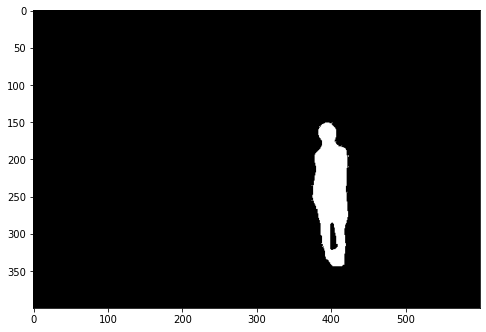

In [106]:
for key, seg_color_BGR in seg_color_BGR_dict.items():

    seg_map = remove_background(key, seg_color_BGR)                       # 누끼따는 remove_background 함수 호출
    if key == 'person':
        seg_map_person = seg_map

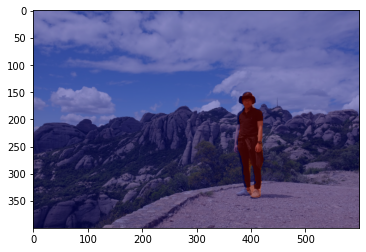

In [108]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든 뒤 두 이미지를 합쳐서 출력
img_show = img_somewhere.copy()

# True과 False인 값을 각각 1과 0으로 변경
# 1과 0에 255을 곱해 각각 255과 0으로 바꿔줍니다
img_mask_person = seg_map_person.astype(np.uint8) * 255             # 아직 여기까지는 흑백인 1채널

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask_person, cv2.COLORMAP_JET)   # 1채널 img_mask를 3채널로 변경함. 이유는 cv2.addWeighted()에서 동일한 채널이어야 하므로

# 원본 이미지와 마스크를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)  # https://docs.opencv.org/3.4/d2/de8/group__core__array.html#gafafb2513349db3bcff51f54ee5592a19
                                                                        

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

###  배경흐리게 하기

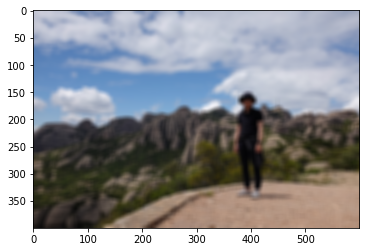

In [110]:
# (10,10)은 blurring kernel size를 뜻합니다
img_orig_blur = cv2.blur(img_somewhere.copy(), (10,10))   # BGR

# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)   
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

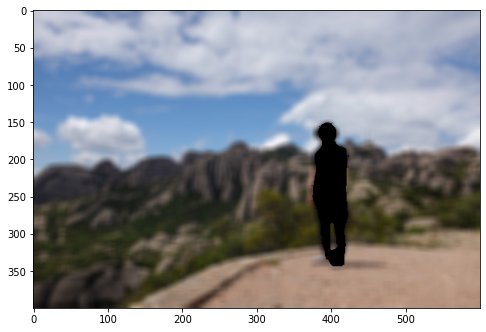

In [120]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 "채널"을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 이미지 색상 채널을 변경해야함 (RGB 형식을 BGR 형식으로 변경) 
img_mask_person_color_BGR = cv2.cvtColor(img_mask_person, cv2.COLOR_GRAY2BGR)    # 1채널을 3채널로 변경

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_person_color_BGR)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)


plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

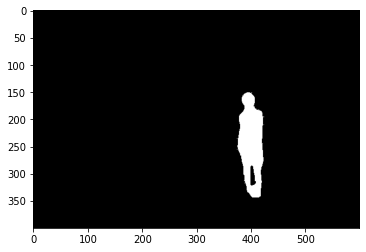

In [114]:
# 확인용
plt.imshow(cv2.cvtColor(img_mask_person, cv2.COLOR_GRAY2BGR))

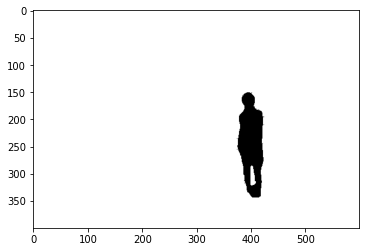

In [116]:
# 확인용
plt.imshow(cv2.bitwise_not(img_mask_person_color_BGR))

### 흐린 배경과 원본 합성

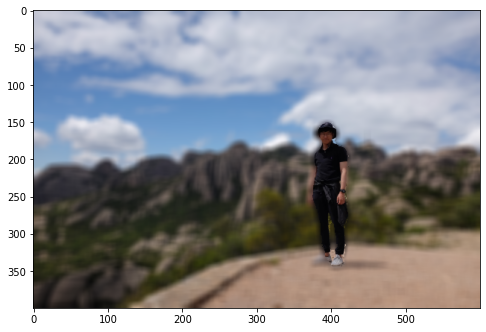

In [121]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고, 그렇지 않으면 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_person_color_BGR==255, img_somewhere, img_bg_blur)


# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

# Step 5. 사진에서 문제점 찾기

그러나 여러분들의 사진에는 무언가 문제점이 있을 것입니다.

아래 사진에도 문제점이 몇 가지 있었습니다. 예를 들어 뒤에 걸린 옷이 인물 영역에 포함되어 blur되지 않고 나온다던가 하는 경우입니다. ㅠㅠ
 그 외 다른 문제들이 눈에 띄시나요? 아래 사진에는 이상한 점이 최소 2개 이상 더 있습니다. 어떤 문제가 있는지 찾아서 아래 사진처럼 표시해 봅시다.

추가로 여러분이 만들어 낸 인물 모드 사진 중 하나에서도 이상한 위치를 찾아 아래 사진처럼 표시해 봅시다. 표시한 이미지들을 jupyter notebook에 포함하여 제출해 주세요.

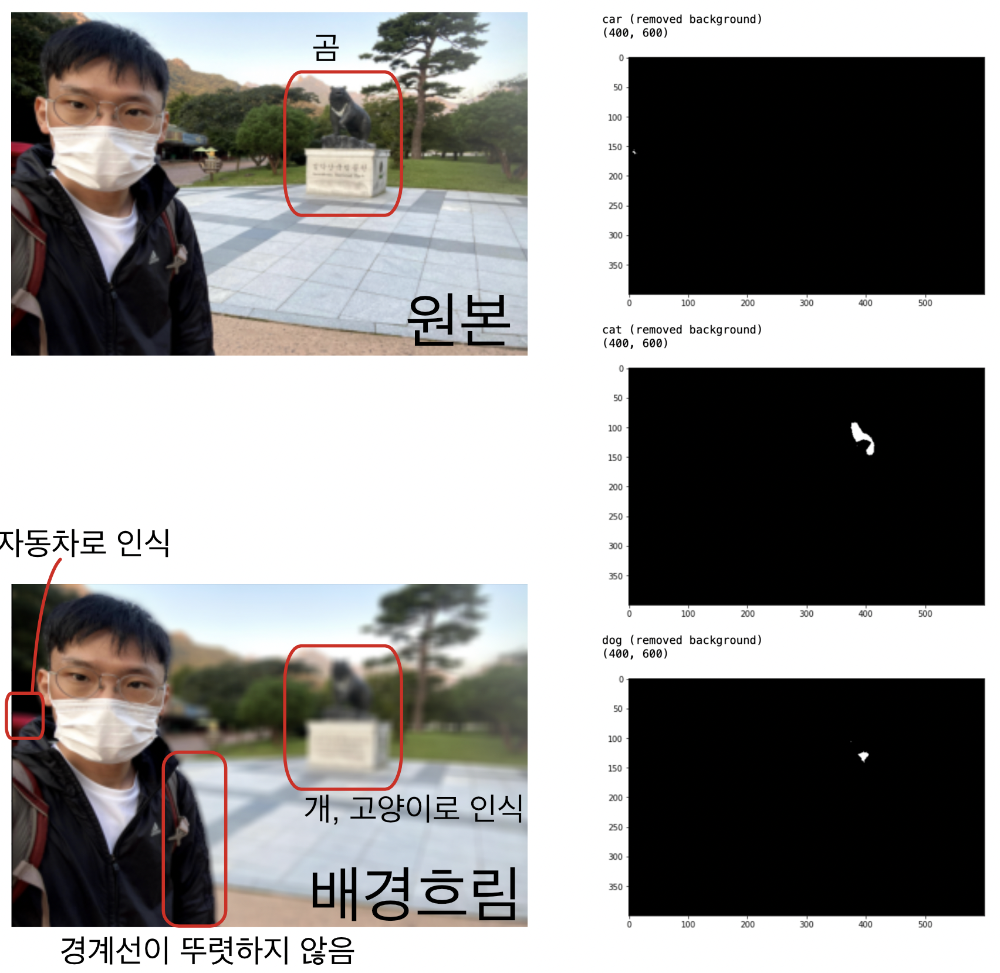


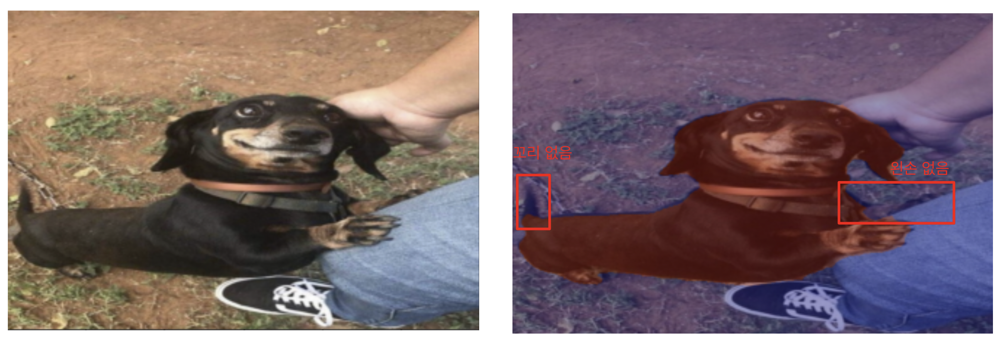

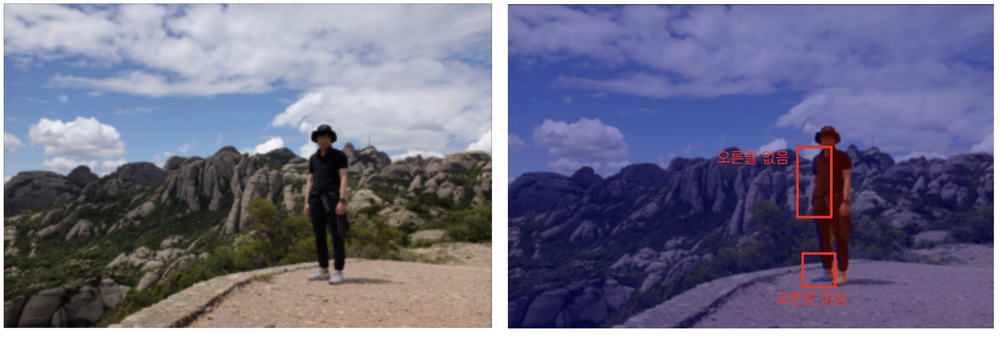

# Step 6. 해결 방법을 제안해 보기

아주 간단히 멋진 카메라 앱 서비스를 만들어 출시할 수 있을 것 같았지만, 지금 같은 완성도로는 어림도 없습니다. 소비자들의 눈높이는 그리 호락호락하지 않고, 엔지니어인 여러분들은 답을 찾아내야 합니다.

생각해 볼 만한 주제를 아래에 몇 가지 제시해 봅니다. 아래를 읽어본 후, 여러분이 만든 인물모드 사진의 문제점을 해결할 방안을 정리하여 제안해 주시기 바랍니다.
단순히 'XXX 기술을 사용한다.' 정도의 선언적 솔루션이 아니라, 여러분들이 선택한 기술이 DeepLab 모델의 Semantic Segmentation 이 만들어 낸 Mask 영역에 어떻게 적용되어 문제점을 보완하게 되는지의 메커니즘이 포함된 솔루션이어야 합니다.

### 세그멘테이션의 한계

Semantic segmentation의 부정확성이 여러 가지 문제를 발생시키는 주요 원인입니다. 피사계심도를 이용한 보케(아웃포커싱) 효과는 말 그대로 심도를 표현하기 때문에 초점이 잡힌 거리를 광학적으로 아주 섬세하게 구별(segmentation) 하지만 이를 따라 한 semantic segmentation 모듈은 정확도가 1.00 이 되지 않는 한 완벽히 구현하기는 힘듭니다.

### 피사계 심도 이해하기

우선 피사계심도의 개념부터 명확히 이해해 봅시다.

- [아웃포커싱 하는 법](https://m.blog.naver.com/typs6301/222172333739)
- [얕은 피사계 심도 촬영의 이해](https://www.adobe.com/kr/creativecloud/photography/discover/shallow-depth-of-field.html)

### 3D Camera 활용하기

이미지를 2D 방식으로 받아들이는 한계를 넘어 3D로 인식하려는 시도는 꽤 오래전부터 계속되어 왔습니다. 기술도 이제는 상당한 수준에 이르렀는데요. 크게는 스테레오 비전, ToF 방식 등이 자주 사용됩니다.
 하드웨어 이미지 센서를 통한 3D 이미징 기술이 많이 발전되었는데요. 아래 참고 자료를 통해 최신 기술을 살펴봐도 좋습니다.

- [3D 이미지센서](https://news.skhynix.co.kr/post/next-gen-3d)

### 소프트웨어 기술 활용하기

하드웨어 개발과 생산에는 비용이 많이 들기 때문에 제한된 하드웨어를 이용하면서 소프트웨어로 그 한계를 극복하려는 노력도 많습니다. 구글의 struct2Depth가 대표적인 예일 것 같습니다.

- [Unsupervised Learning of Depth and Ego-Motion: A Structured Approach](https://sites.google.com/view/struct2depth)

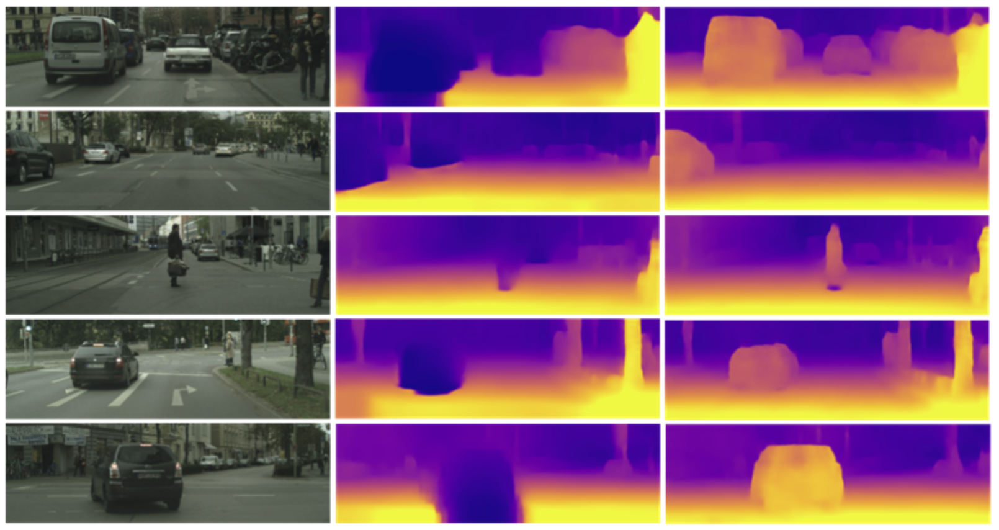

딥러닝이 발전한 지금은 더 다양한 기술이 개발되어 있으니 잘 탐색해 보세요.

다른 기술과 융합해 보기

구글 pixel4에는 IR(적외선) 카메라가 달려있는데요. 물체의 온도를 측정하는 IR 카메라와 3D 이미지는 크게 관련이 없을 것 같지만, 이를 통해 보다 멋진 3d depth sensing이 가능하다는군요.

- [uDepth: Real-time 3D Depth Sensing on the Pixel 4](https://ai.googleblog.com/2020/04/udepth-real-time-3d-depth-sensing-on.html)

이렇게 카메라와 무관한 다른 기술과 융합하는 것도 좋은 해결책이 될 수 있습니다. 한 번 고민해 보세요!

이 외에도 다른 방식으로 접근해도 좋습니다. 엔지니어로서 본인이 선택한 솔루션을 잘 설명해 주세요. 가능하다면 순서도(Flow Chart)를 활용하면 좋습니다. 멋진 아이디어를 기대하겠습니다!!



전파를 이용한 방법
1. 전파를 쏘고 돌아오는데 걸리는 시간을 계산하면 현재 위치에서 떨어진 물체와의 거리를 계산할 수 있다. 

카메라 메타데이터를 이용한 방법
1. 카메라를 촬영하면 메타데이터에 초점 거리 정보가 있다. 따라서 초점이 맞은 피사체의 거리는 알고 있으므로 다른 피사체들과의 상대거리를 예측할 수 있다
2. 한 이미지에 여러 사람이 있다면 사람들의 크기에 따라 거리를 예측할 수도 있다. 예를 들면 키 180인 사람이 두 사람이 있다면 가까운 사람은 크게 보일 것이고 멀리 있는 사람은 작게 보일것이다.
3. 따라서 초점이 맞는 부분으로부터 상대 거리를 추정할 수 있을것이고 그에 따라 심도를 대략적으로 예측할 수있다

# STEP 7. 회고

In [ ]:
1. 이번 프로젝트에서 어려웠던 점 
    - 마스크 활용을 처음 사용해봐서 처음에 이해하는데 힘들었습니다
    
2. 프로젝트를 진행하면서 알아낸 점 혹은 아직 모호한 점
    - 이미지와 영상에서 심도 표현이 중요하다는 점을 알게되었습니다

3. 루브릭 평가 지표를 맞추기 위해 시도한 것들
    - 아웃포커싱을 3장의 사진을 사용하여 시도해봤습니다
    - 개체의 정확한 경계선을 구분하지 못하는 곳이 있음을 발견할 수 있었습니다
    - 새로운 솔루션을 제시했습니다
    
4. 만약에 루브릭 평가 관련 지표를 달성 하지 못했을 때, 이유에 관한 추정  
    - 달성함

    
5. 자기 다짐
     - 언제나 코드를 읽고 이해하는게 빠르지 못하는데, 더 빨리 읽고 이해할 수 있는 실력을 만들겠다
    